In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

### Summarisation

In [2]:
df=pd.read_csv('lixan23.csv')

In [3]:
df.describe(include='all')

,age,job,marital,education,default,balance,housing,loan,contact,day,duration,campaign,pdays,previous,poutcome,y
count,5000.000000,5000,5000,5000,5000,5000.000000,5000,5000,5000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000,5000
unique,NaN,12,3,4,2,NaN,2,2,3,NaN,NaN,NaN,NaN,NaN,4,2
top,NaN,blue-collar,married,secondary,no,NaN,yes,no,cellular,NaN,NaN,NaN,NaN,NaN,unknown,no
freq,NaN,1096,2969,2578,4920,NaN,2828,4224,3271,NaN,NaN,NaN,NaN,NaN,4084,4442
mean,40.849200,NaN,NaN,NaN,NaN,1347.323400,NaN,NaN,NaN,15.920800,254.607200,2.727600,40.333400,0.619200,NaN,NaN
std,10.500062,NaN,NaN,NaN,NaN,2947.026557,NaN,NaN,NaN,8.421444,250.466852,3.016226,100.163051,4.323093,NaN,NaN
min,18.000000,NaN,NaN,NaN,NaN,-6847.000000,NaN,NaN,NaN,1.000000,2.000000,1.000000,-1.000000,0.000000,NaN,NaN
25%,33.000000,NaN,NaN,NaN,NaN,67.750000,NaN,NaN,NaN,8.000000,101.000000,1.000000,-1.000000,0.000000,NaN,NaN
50%,39.000000,NaN,NaN,NaN,NaN,436.500000,NaN,NaN,NaN,16.000000,177.000000,2.000000,-1.000000,0.000000,NaN,NaN
75%,48.000000,NaN,NaN,NaN,NaN,1380.500000,NaN,NaN,NaN,22.000000,314.250000,3.000000,-1.000000,0.000000,NaN,NaN


Categorical data processing

In [4]:
df_cate = df.select_dtypes(include=['object']).copy()
df_numeric=df.select_dtypes(include=['int64']).copy()

In [5]:
df_binary=df_cate[['default','housing','loan','y']]
for i in df_binary.columns:
    df_binary.loc[df_cate[i]=='no',i]=0
    df_binary.loc[df_cate[i]=='yes',i]=1

/opt/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ret

In [6]:
from sklearn.preprocessing import LabelBinarizer
lb = LabelBinarizer()
def binary_convert(a):
    lb_results = lb.fit_transform(df_cate[a])
    df_onehot = pd.DataFrame(lb_results, columns=lb.classes_)
    for col in list(df_onehot.columns):
        df_onehot.rename(columns={col:(a+'_'+col)},inplace = True)
    return df_onehot
df_job_onehot=binary_convert('job')
df_mar_onehot=binary_convert('marital')
df_edu_onehot=binary_convert('education')
df_contact_onehot=binary_convert('contact')
df_pout_onehot=binary_convert('poutcome')

In [7]:
df_convert = pd.concat([df_numeric,df_binary, df_job_onehot,df_mar_onehot, 
                        df_edu_onehot, df_contact_onehot, df_pout_onehot], 
                       axis=1, sort=False)
df_cv=df_convert.astype('int64')

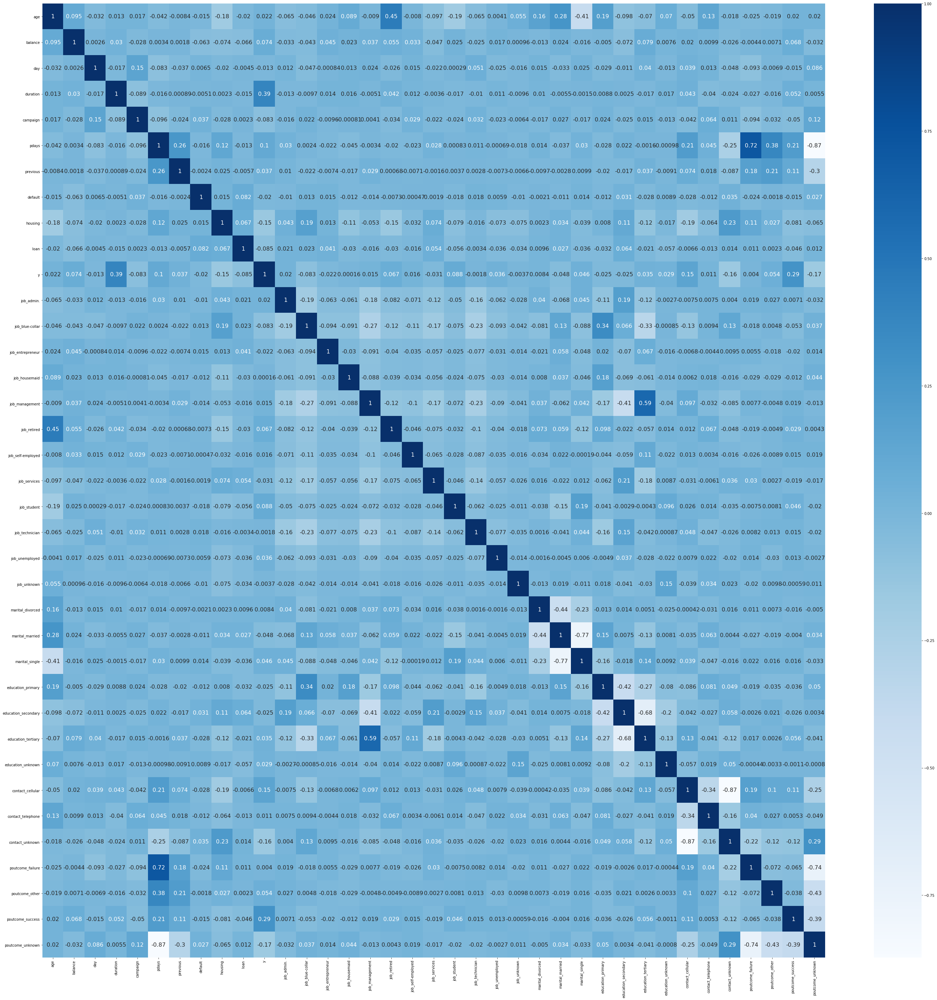

In [8]:
# Plotting heat map
corrmat = df_cv.corr()
corrmat.to_csv('corrmat.csv')
top_corr_features = corrmat.index
plt.figure(figsize=(50,50))
#plot heat map
g=sns.heatmap(df_cv[top_corr_features].corr(),annot=True,cmap="Blues",annot_kws={"size": 16})

In [9]:
# Correlation importance ranking
df_corr=df_cv.corr()[['y']]
df_corr['abs']=abs(df_corr['y'])
print(df_corr.sort_values(by='abs',ascending=False))
feat_imp_corr=df_corr.sort_values(by='abs',ascending=False).index

                            y       abs
y                    1.000000  1.000000
duration             0.389526  0.389526
poutcome_success     0.289926  0.289926
poutcome_unknown    -0.165472  0.165472
contact_unknown     -0.163084  0.163084
housing             -0.154546  0.154546
contact_cellular     0.149512  0.149512
pdays                0.101752  0.101752
job_student          0.088303  0.088303
loan                -0.085255  0.085255
job_blue-collar     -0.083390  0.083390
campaign            -0.082558  0.082558
balance              0.074232  0.074232
job_retired          0.067322  0.067322
poutcome_other       0.053576  0.053576
marital_married     -0.048293  0.048293
marital_single       0.046371  0.046371
previous             0.036513  0.036513
job_unemployed       0.035541  0.035541
education_tertiary   0.034773  0.034773
job_services        -0.030987  0.030987
education_unknown    0.028561  0.028561
education_primary   -0.025093  0.025093
education_secondary -0.025044  0.025044


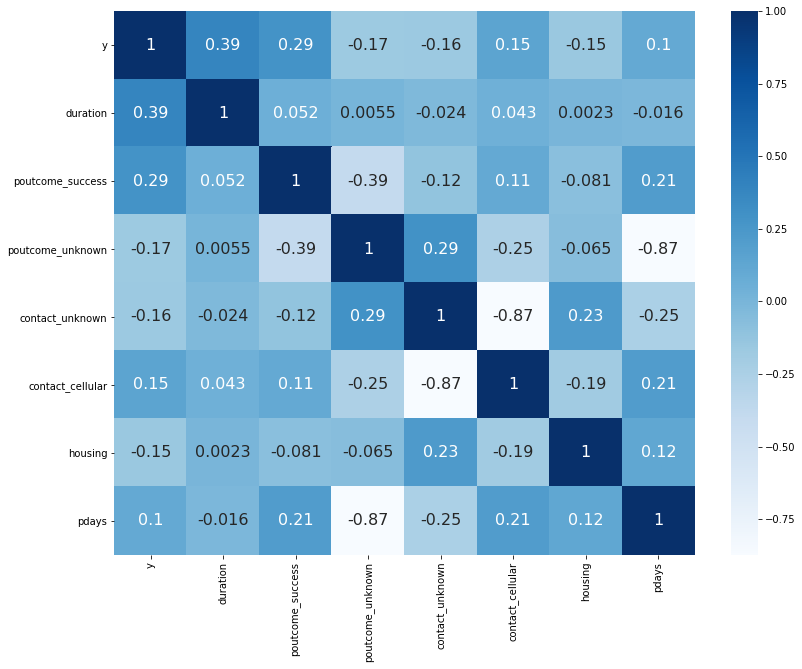

In [10]:
# Shortened heat map
df_cv_top=df_cv[['y','duration','poutcome_success','poutcome_unknown','contact_unknown','contact_cellular','housing','pdays']]
corrmat1 = df_cv_top.corr()
top_corr_features1 = corrmat1.index
plt.figure(figsize=(13,10))
#plot heat map
g=sns.heatmap(df_cv_top[top_corr_features1].corr(),annot=True,cmap="Blues", annot_kws={"size": 16})

In [12]:
# Variables with strong relationship
relationship=corrmat.where(abs(corrmat)>=0.3)
relationship.to_csv('relationship.csv')
relationship

,age,balance,day,duration,campaign,pdays,previous,default,housing,loan,...,education_secondary,education_tertiary,education_unknown,contact_cellular,contact_telephone,contact_unknown,poutcome_failure,poutcome_other,poutcome_success,poutcome_unknown
age,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
balance,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
day,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
duration,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
campaign,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pdays,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.719841,0.376092,NaN,-0.870918
previous,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.302345
default,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
housing,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
loan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Exploration

In [13]:
Y=df_cv[['y']]
X=df_cv.loc[:,df_cv.columns!='y']
X_no_du=X.loc[:,X.columns!='duration']

Tree visualisation

In [14]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
ct = DecisionTreeClassifier(min_samples_leaf=30, max_depth=10, random_state=42)

In [15]:
ct.fit(X,Y)
fn=['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous',
       'default', 'housing', 'loan', 'job_admin.', 'job_blue-collar',
       'job_entrepreneur', 'job_housemaid', 'job_management', 'job_retired',
       'job_self-employed', 'job_services', 'job_student', 'job_technician',
       'job_unemployed', 'job_unknown', 'marital_divorced', 'marital_married',
       'marital_single', 'education_primary', 'education_secondary',
       'education_tertiary', 'education_unknown', 'contact_cellular',
       'contact_telephone', 'contact_unknown', 'poutcome_failure',
       'poutcome_other', 'poutcome_success', 'poutcome_unknown','pday_1']
cn=['no','yes']
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (10,10), dpi=2000)
tree.plot_tree(ct,
               feature_names = fn, 
               class_names=cn,
               filled = True)

[Text(10496.286651234568, 14413.636363636364, 'duration <= 392.5\ngini = 0.198\nsamples = 5000\nvalue = [4442, 558]\nclass = no'),
 Text(7501.832561728395, 13040.909090909092, 'poutcome_success <= 0.5\ngini = 0.116\nsamples = 4120\nvalue = [3865, 255]\nclass = no'),
 Text(6249.03549382716, 11668.181818181818, 'age <= 60.5\ngini = 0.09\nsamples = 3993\nvalue = [3805, 188]\nclass = no'),
 Text(4700.231481481482, 10295.454545454544, 'duration <= 203.5\ngini = 0.08\nsamples = 3914\nvalue = [3750, 164]\nclass = no'),
 Text(2176.6975308641977, 8922.727272727272, 'duration <= 95.5\ngini = 0.047\nsamples = 2718\nvalue = [2652, 66]\nclass = no'),
 Text(574.0740740740741, 7550.0, 'housing <= 0.5\ngini = 0.011\nsamples = 1114\nvalue = [1108, 6]\nclass = no'),
 Text(382.71604938271605, 6177.272727272728, 'age <= 28.5\ngini = 0.025\nsamples = 482\nvalue = [476, 6]\nclass = no'),
 Text(191.35802469135803, 4804.545454545454, 'gini = 0.105\nsamples = 36\nvalue = [34, 2]\nclass = no'),
 Text(574.074074

[Text(5149.278846153846, 5765.454545454545, 'poutcome_success <= 0.5\ngini = 0.198\nsamples = 5000\nvalue = [4442, 558]\nclass = no'),
 Text(4239.868233618234, 5216.363636363636, 'contact_unknown <= 0.5\ngini = 0.171\nsamples = 4832\nvalue = [4375, 457]\nclass = no'),
 Text(3130.911680911681, 4667.272727272727, 'age <= 59.5\ngini = 0.214\nsamples = 3398\nvalue = [2985, 413]\nclass = no'),
 Text(2199.1452991452993, 4118.181818181818, 'housing <= 0.5\ngini = 0.199\nsamples = 3248\nvalue = [2884, 364]\nclass = no'),
 Text(1028.917378917379, 3569.090909090909, 'balance <= 1368.5\ngini = 0.251\nsamples = 1564\nvalue = [1334, 230]\nclass = no'),
 Text(450.4273504273504, 3020.0, 'age <= 26.5\ngini = 0.207\nsamples = 1151\nvalue = [1016, 135]\nclass = no'),
 Text(247.2934472934473, 2470.9090909090905, 'balance <= 347.5\ngini = 0.42\nsamples = 70\nvalue = [49, 21]\nclass = no'),
 Text(176.63817663817665, 1921.818181818182, 'gini = 0.264\nsamples = 32\nvalue = [27, 5]\nclass = no'),
 Text(317.94

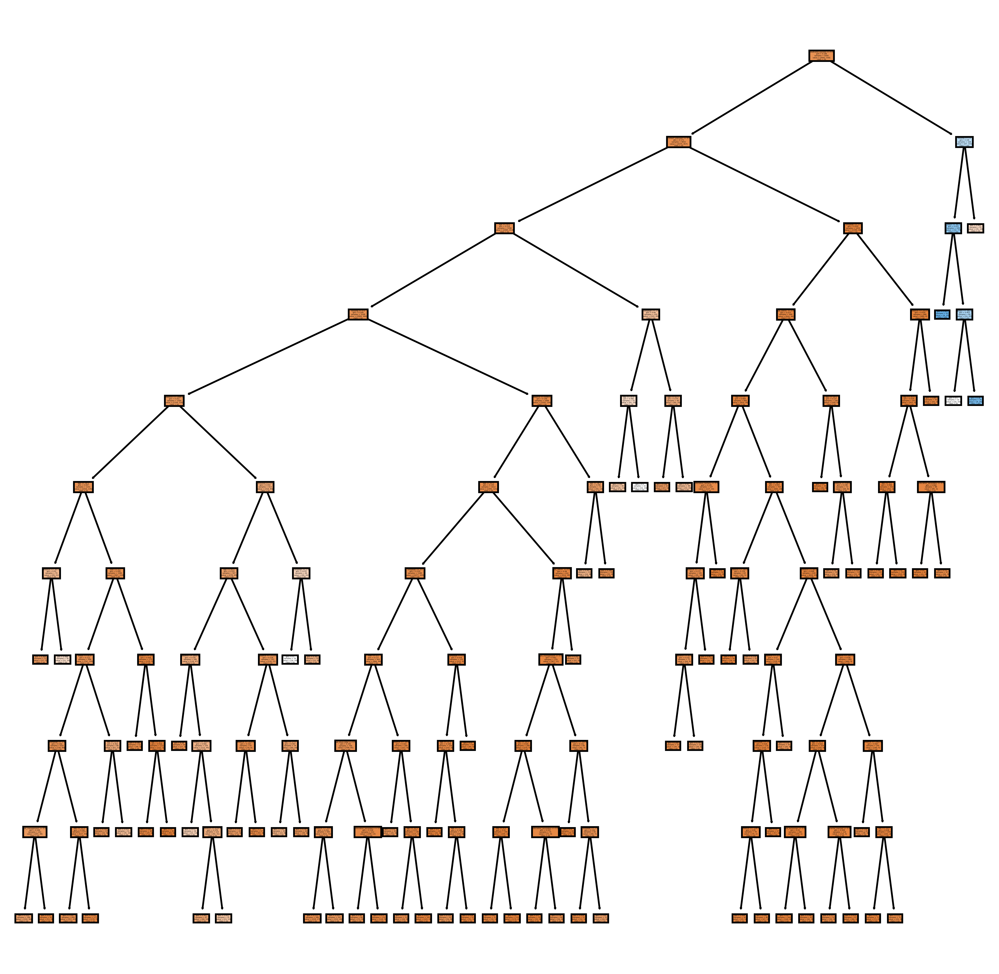

In [16]:
ct.fit(X_no_du,Y)
fn=['age', 'balance', 'day', 'campaign', 'pdays', 'previous', 'default',
       'housing', 'loan', 'job_admin.', 'job_blue-collar', 'job_entrepreneur',
       'job_housemaid', 'job_management', 'job_retired', 'job_self-employed',
       'job_services', 'job_student', 'job_technician', 'job_unemployed',
       'job_unknown', 'marital_divorced', 'marital_married', 'marital_single',
       'education_primary', 'education_secondary', 'education_tertiary',
       'education_unknown', 'contact_cellular', 'contact_telephone',
       'contact_unknown', 'poutcome_failure', 'poutcome_other',
       'poutcome_success', 'poutcome_unknown']
cn=['no','yes']
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (10,10), dpi=800)
tree.plot_tree(ct,
               feature_names = fn, 
               class_names=cn,
               filled = True)

Feature importance

In [56]:
#Tuning Tree with precision
from sklearn import feature_selection 
from sklearn import decomposition, datasets
from sklearn.model_selection import GridSearchCV
ct1=DecisionTreeClassifier(random_state=42)
criterion = ['gini', 'entropy']
max_depth = list(range(1,10))
min_samples_leaf=list(range(1,100))
parameters = dict(criterion=criterion,
                  max_depth=max_depth,
                 min_samples_leaf=min_samples_leaf)
ct_GS = GridSearchCV(ct1, parameters, scoring='precision',cv=5)
ct_GS.fit(X_no_du, Y)
print(ct_GS.best_params_)
print(ct_GS.best_estimator_)
print(ct_GS.best_score_)

{'criterion': 'entropy', 'max_depth': 4, 'min_samples_leaf': 26}
DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=4, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=26, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best')
0.7054725975778607


In [17]:
# Feature importance for precision
ct_pre=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=4, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=26, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best')
ct_pre.fit(X_no_du,Y)
feat_importance = ct_pre.tree_.compute_feature_importances(normalize=False)
feat_imp_dict = dict(zip(X_no_du.columns, ct_pre.feature_importances_))
feat_imp = pd.DataFrame.from_dict(feat_imp_dict, orient='index')
feat_imp.rename(columns = {0:'FeatureImportance'}, inplace = True)
feat_imp_pre=feat_imp.sort_values(by=['FeatureImportance'], ascending=False)
feat_imp_pre

,FeatureImportance
poutcome_success,0.485918
contact_unknown,0.229976
housing,0.131605
pdays,0.089199
job_blue-collar,0.023103
balance,0.020598
campaign,0.019599
education_tertiary,0.000000
marital_married,0.000000
marital_single,0.000000


In [19]:
# Checking precision, recall and f1 with tree_pre
from sklearn.model_selection import cross_val_score
print('precision:', np.mean(cross_val_score(ct_pre,X=X_no_du,y=Y, scoring='precision',cv=5)))
print('recall:', np.mean(cross_val_score(ct_pre,X=X_no_du,y=Y, scoring='recall',cv=5)))
print('f1:', np.mean(cross_val_score(ct_pre,X=X_no_du,y=Y, scoring='f1',cv=5)))
print('accuracy:', np.mean(cross_val_score(ct_pre,X=X_no_du,y=Y, scoring='accuracy',cv=5)))

precision: 0.7054725975778607
recall: 0.1325772200772201
f1: 0.22245100627823744
accuracy: 0.8972


In [20]:
# Checking precision, recall and f1 with tree_pre when only include 'poutcome_success' and 'housing'
X_temp=X[['poutcome_success','housing']]
ct_temp=DecisionTreeClassifier(random_state=42)
print('precision:', np.mean(cross_val_score(ct_temp,X=X_temp,y=Y, scoring='precision',cv=5)))
print('recall:', np.mean(cross_val_score(ct_temp,X=X_temp,y=Y, scoring='recall',cv=5)))
print('f1:', np.mean(cross_val_score(ct_temp,X=X_temp,y=Y, scoring='f1',cv=5)))
print('accuracy:', np.mean(cross_val_score(ct_temp,X=X_temp,y=Y, scoring='accuracy',cv=5)))

precision: 0.695708287813551
recall: 0.13798262548262547
f1: 0.22907626507740925
accuracy: 0.8974


In [60]:
#Tuning Tree with recall
criterion = ['gini', 'entropy']
max_depth = list(range(1,40))
min_samples_leaf=list(range(1,100))
parameters = dict(criterion=criterion,
                  max_depth=max_depth,
                 min_samples_leaf=min_samples_leaf)
ct_GS = GridSearchCV(ct1, parameters, scoring='recall',cv=5)
ct_GS.fit(X_no_du, Y)
print(ct_GS.best_params_)
print(ct_GS.best_estimator_)
print(ct_GS.best_score_)

{'criterion': 'entropy', 'max_depth': 28, 'min_samples_leaf': 1}
DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=28, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best')
0.26702059202059203


In [61]:
# Feature importance for recall
ct_re=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=28, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best')
ct_re.fit(X_no_du,Y)
feat_importance = ct_re.tree_.compute_feature_importances(normalize=False)
feat_imp_dict = dict(zip(X_no_du.columns, ct_re.feature_importances_))
feat_imp = pd.DataFrame.from_dict(feat_imp_dict, orient='index')
feat_imp.rename(columns = {0:'FeatureImportance'}, inplace = True)
feat_imp_re=feat_imp.sort_values(by=['FeatureImportance'], ascending=False)
feat_imp_re

,FeatureImportance
balance,0.258503
age,0.144725
day,0.129438
poutcome_success,0.071390
campaign,0.056302
pdays,0.051503
contact_unknown,0.033788
housing,0.020679
education_tertiary,0.018390
previous,0.017779


In [64]:
# Checking precision, recall and f1 with tree_re
print('precision:', np.mean(cross_val_score(ct_re,X=X_no_du,y=Y, scoring='precision',cv=5)))
print('recall:', np.mean(cross_val_score(ct_re,X=X_no_du,y=Y, scoring='recall',cv=5)))
print('f1:', np.mean(cross_val_score(ct_re,X=X_no_du,y=Y, scoring='f1',cv=5)))
print('accuracy:', np.mean(cross_val_score(ct_re,X=X_no_du,y=Y, scoring='accuracy',cv=5)))

precision: 0.25246460899138695
recall: 0.26702059202059203
f1: 0.2590218674770288
f1: 0.8286000000000001


### Model evaluation

In [21]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=42)
X_train_min=X_train[['poutcome_success','housing']]
X_test_min=X_test[['poutcome_success','housing']]

In [22]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn import neighbors
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import CategoricalNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.dummy import DummyClassifier

In [23]:
knn = neighbors.KNeighborsClassifier()
dm = DummyClassifier(strategy='most_frequent',random_state=42)
rf= RandomForestClassifier(random_state=42)
lr=LogisticRegression()
gnb=GaussianNB()
cnb=CategoricalNB()

In [54]:
# Tuning Tree
criterion = ['gini', 'entropy']
max_depth = list(range(1,10))
min_samples_leaf=list(range(1,100))
parameters = dict(criterion=criterion,
                  max_depth=max_depth,
                 min_samples_leaf=min_samples_leaf)
ct_GS = GridSearchCV(ct1, parameters, scoring='precision',cv=5)
ct_GS.fit(X_train_min, Y_train)
print(ct_GS.best_params_)
print(ct_GS.best_estimator_)
print(ct_GS.best_score_)

/opt/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision 

{'criterion': 'gini', 'max_depth': 2, 'min_samples_leaf': 1}
DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=2, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best')
0.7366666666666667


/opt/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision 

In [56]:
# Tuning kNN - scaling no require as all input are binary
n_neighbors = list(range(1,30))
parameters = dict(n_neighbors=n_neighbors)
knn_GS = GridSearchCV(knn, parameters,scoring='precision', cv=5)
knn_GS.fit(X_train_min,Y_train)
print(knn_GS.best_params_)
print(knn_GS.best_estimator_)
print(knn_GS.best_score_)

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:515: DataConversionWarning: A column-vector y

{'n_neighbors': 7}
KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=7, p=2,
                     weights='uniform')
0.7366666666666667


/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:515: DataConversionWarning: A column-vector y

In [60]:
# Tuning RF
n_estimators = list(range(5,100,5))
max_depth=list(range(2,15))
parameters = dict(n_estimators = n_estimators, max_depth=max_depth)
rf=RandomForestClassifier(random_state=42)
rf_GS = GridSearchCV(rf, parameters, cv = 5, scoring='precision')
rf_GS.fit(X_train_min, Y_train)
print(rf_GS.best_params_)
print(rf_GS.best_estimator_)
print(rf_GS.best_score_)

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:515: DataConversionWarning: A column-vector y wa

{'max_depth': 2, 'n_estimators': 5}
RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=2, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=5,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)
0.7366666666666667


/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:739: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


In [24]:
# Tuned model
ct_tuned=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=2, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best')
knn_tuned=neighbors.KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski', n_neighbors=7, p=2,
                     weights='uniform')
rf_tuned=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=2, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=5,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [25]:
ct_tuned.fit(X_train_min,Y_train)
rf_tuned.fit(X_train_min,Y_train)
knn_tuned.fit(X_train_min,Y_train)
lr.fit(X_train_min,Y_train)
cnb.fit(X_train_min,Y_train)
dm.fit(X_train_min,Y_train)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, )

DummyClassifier(constant=None, random_state=42, strategy='most_frequent')

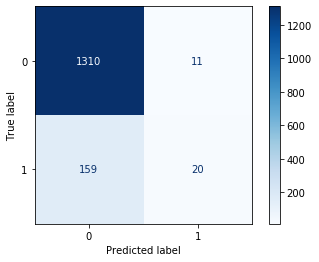

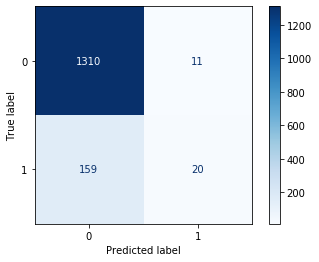

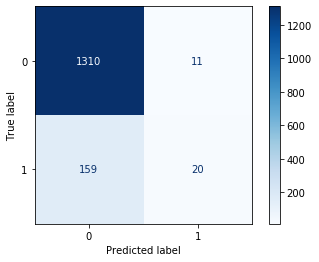

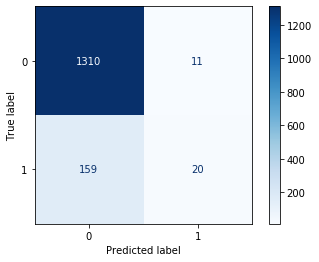

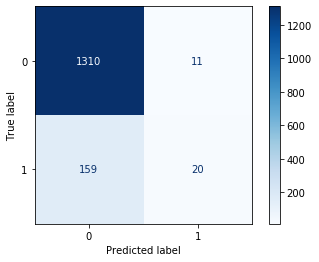

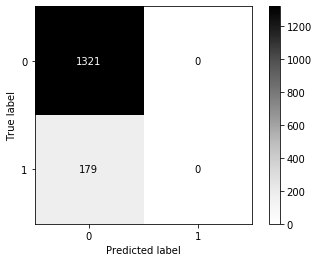

In [27]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(lr, X=X_test_min, y_true=Y_test, values_format='d', cmap='Blues')
plot_confusion_matrix(ct_tuned, X=X_test_min, y_true=Y_test, values_format='d', cmap='Blues')
plot_confusion_matrix(rf_tuned, X=X_test_min, y_true=Y_test, values_format='d', cmap='Blues')
plot_confusion_matrix(knn_tuned, X=X_test_min, y_true=Y_test, values_format='d', cmap='Blues')
plot_confusion_matrix(cnb, X=X_test_min, y_true=Y_test, values_format='d', cmap='Blues')
plot_confusion_matrix(dm, X=X_test_min, y_true=Y_test, values_format='d', cmap='Greys')

In [28]:
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import accuracy_score
print('lr:', precision_score(Y_test,lr.predict(X_test_min)), recall_score(Y_test,lr.predict(X_test_min)),accuracy_score(Y_test,lr.predict(X_test_min)))
print('ct:', precision_score(Y_test,ct_tuned.predict(X_test_min)), recall_score(Y_test,ct_tuned.predict(X_test_min)),accuracy_score(Y_test,ct_tuned.predict(X_test_min)))
print('rf:', precision_score(Y_test,rf_tuned.predict(X_test_min)), recall_score(Y_test,rf_tuned.predict(X_test_min)),accuracy_score(Y_test,rf_tuned.predict(X_test_min)))
print('knn:', precision_score(Y_test,knn_tuned.predict(X_test_min)), recall_score(Y_test,knn_tuned.predict(X_test_min)),accuracy_score(Y_test,knn_tuned.predict(X_test_min)))
print('nb:', precision_score(Y_test,cnb.predict(X_test_min)), recall_score(Y_test,cnb.predict(X_test_min)),accuracy_score(Y_test,cnb.predict(X_test_min)))
print('dm:', precision_score(Y_test,dm.predict(X_test_min)), recall_score(Y_test,dm.predict(X_test_min)),accuracy_score(Y_test,dm.predict(X_test_min)))

lr: 0.6451612903225806 0.11173184357541899 0.8866666666666667
ct: 0.6451612903225806 0.11173184357541899 0.8866666666666667
rf: 0.6451612903225806 0.11173184357541899 0.8866666666666667
knn: 0.6451612903225806 0.11173184357541899 0.8866666666666667
nb: 0.6451612903225806 0.11173184357541899 0.8866666666666667
dm: 0.0 0.0 0.8806666666666667


/opt/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


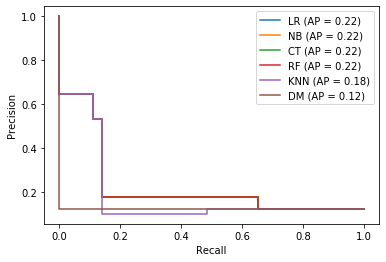

In [37]:
# Trade-off with X min
from sklearn.metrics import plot_precision_recall_curve
plot_precision_recall_curve(lr, X_test_min, Y_test, ax=plt.gca(),name = 'LR')
plot_precision_recall_curve(cnb, X_test_min, Y_test, ax=plt.gca(),name = 'NB')
plot_precision_recall_curve(ct_tuned, X_test_min, Y_test, ax=plt.gca(),name = 'CT')
plot_precision_recall_curve(rf_tuned, X_test_min, Y_test, ax=plt.gca(),name = 'RF')
plot_precision_recall_curve(knn_tuned, X_test_min, Y_test, ax=plt.gca(),name = 'KNN')
plot_precision_recall_curve(dm, X_test_min, Y_test, ax=plt.gca(),name = 'DM')
plt.legend(bbox_to_anchor=(1, 1))

In [38]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
folds = KFold(n_splits=5, shuffle=True, random_state=42)

In [39]:
ct=DecisionTreeClassifier(random_state=42)
rf=RandomForestClassifier(random_state=42)
name=list(range(1,36))
lr_f1=[]
ct_f1=[]
nb_f1=[]
rf_f1=[]
lr_pre=[]
ct_pre=[]
nb_pre=[]
rf_pre=[]
lr_re=[]
ct_re=[]
nb_re=[]
rf_re=[]

for i in feat_imp_pre.index:
    if i=='poutcome_success':
        X_temp=X[[i]]
    else:
        X_temp[i]=X[i]
    lr_scores1 = cross_val_score(lr, X_temp, Y, scoring='f1', cv=folds)
    lr_f1.append(np.mean(lr_scores1))
    lr_scores2 = cross_val_score(lr, X_temp, Y, scoring='precision', cv=folds)
    lr_pre.append(np.mean(lr_scores2))
    lr_scores3 = cross_val_score(lr, X_temp, Y, scoring='recall', cv=folds)
    lr_re.append(np.mean(lr_scores3))   
    
    ct_scores1 = cross_val_score(ct, X_temp, Y, scoring='f1', cv=folds)
    ct_f1.append(np.mean(ct_scores1))
    ct_scores2 = cross_val_score(ct, X_temp, Y, scoring='precision', cv=folds)
    ct_pre.append(np.mean(ct_scores2))
    ct_scores3 = cross_val_score(ct, X_temp, Y, scoring='recall', cv=folds)
    ct_re.append(np.mean(ct_scores3))     
    
    nb_scores1 = cross_val_score(gnb, X_temp, Y, scoring='f1', cv=folds)
    nb_f1.append(np.mean(nb_scores1))
    nb_scores2 = cross_val_score(gnb, X_temp, Y, scoring='precision', cv=folds)
    nb_pre.append(np.mean(nb_scores2))
    nb_scores3 = cross_val_score(gnb, X_temp, Y, scoring='recall', cv=folds)
    nb_re.append(np.mean(nb_scores3))   
    
    rf_scores1 = cross_val_score(rf, X_temp, Y, scoring='f1', cv=folds)
    rf_f1.append(np.mean(rf_scores1))
    rf_scores2 = cross_val_score(rf, X_temp, Y, scoring='precision', cv=folds)
    rf_pre.append(np.mean(rf_scores2))
    rf_scores3 = cross_val_score(rf, X_temp, Y, scoring='recall', cv=folds)
    rf_re.append(np.mean(rf_scores3))
    
    


/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), 

In [40]:
# Trade-off table
table = {'added_features': feat_imp_pre.index,'ct_pre': ct_pre, 'ct_re': ct_re,'ct_f1':ct_f1,
        'nb_pre': nb_pre, 'nb_re': nb_re,'nb_f1':nb_f1,
        'rf_pre': rf_pre, 'rf_re': rf_re,'rf_f1':rf_f1,
        'lr_pre': lr_pre, 'lr_re': lr_re,'lr_f1':lr_f1,}
trade_off_table = pd.DataFrame(data=table)
trade_off_table.to_csv('trade_off.csv')
trade_off_table

,added_features,ct_pre,ct_re,ct_f1,nb_pre,nb_re,nb_f1,rf_pre,rf_re,rf_f1,lr_pre,lr_re,lr_f1
0,poutcome_success,0.596248,0.182733,0.278469,0.596248,0.182733,0.278469,0.596248,0.182733,0.278469,0.596248,0.182733,0.278469
1,contact_unknown,0.596248,0.182733,0.278469,0.596248,0.182733,0.278469,0.599877,0.182733,0.278839,0.599877,0.182733,0.278839
2,housing,0.708464,0.139918,0.232678,0.596248,0.182733,0.278469,0.708464,0.139918,0.232678,0.708464,0.139918,0.232678
3,pdays,0.505397,0.163804,0.246574,0.538877,0.196356,0.286655,0.477766,0.167282,0.247377,0.668086,0.147219,0.239721
4,job_blue-collar,0.520021,0.172072,0.258055,0.527834,0.198483,0.287296,0.497077,0.180037,0.263568,0.677646,0.149346,0.242520
5,balance,0.265031,0.245769,0.254061,0.436829,0.217436,0.289136,0.297715,0.244382,0.266346,0.662246,0.136735,0.225158
6,campaign,0.244460,0.239781,0.241017,0.380631,0.249349,0.297941,0.303097,0.224331,0.255951,0.674074,0.134770,0.222654
7,education_tertiary,0.258147,0.262266,0.259393,0.383002,0.250587,0.300250,0.340128,0.235732,0.277267,0.677104,0.136622,0.225397
8,marital_married,0.261391,0.274618,0.266599,0.376590,0.252326,0.299962,0.363008,0.228520,0.279232,0.645659,0.096708,0.164017
9,marital_single,0.261283,0.283179,0.268783,0.372923,0.254134,0.299467,0.388947,0.241237,0.295300,0.652528,0.124561,0.205869


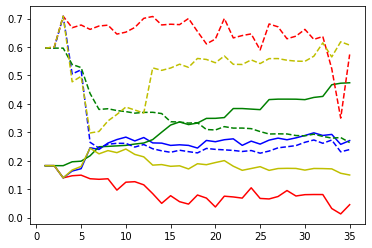

In [41]:
# Plot trade-off precision vs recall
name=list(range(1,36))
plt.plot(name, lr_re,'r-')
plt.plot(name, ct_re,'b-')
plt.plot(name, nb_re,'g-')
plt.plot(name, rf_re,'y-')
plt.plot(name, lr_pre,'r--')
plt.plot(name, ct_pre,'b--')
plt.plot(name, nb_pre,'g--')
plt.plot(name, rf_pre,'y--')


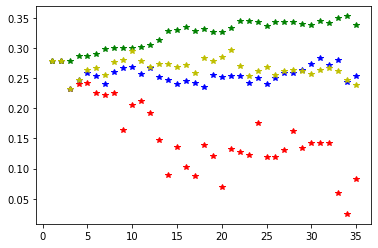

In [42]:
# Plot f1
plt.plot(name, lr_f1,'r*')
plt.plot(name, ct_f1,'b*')
plt.plot(name, nb_f1,'g*')
plt.plot(name, rf_f1,'y*')